## Easy way to make Color Palette with ML

![color palette](https://cf-images.us-east-1.prod.boltdns.net/v1/jit/6057277746001/63584937-f61a-4614-b5da-84f7e5aa0b6a/main/1280x720/7s690ms/match/image.jpg)

**Color palette** is one of the most important in visualization

I like web design and data visualization, so I look up the color palette a lot.

This time, I will use clustering to create a color palette in machine learning.

## 1. Import Libarary

I will only call the most basic library.

- `numpy` : processing data
- `matplotlib` : plotting
- `sklearn` : clustering

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.cluster import DBSCAN, KMeans

## 2. Read Image & Convert

Let's get the image from [unsplash](https://unsplash.com/).

You can crawl the image using `requests`.

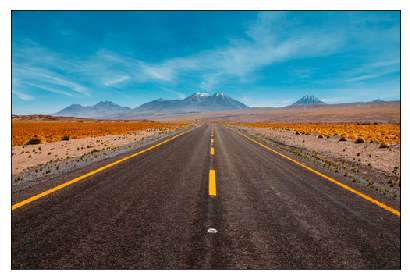

In [2]:
import requests
from PIL import Image
from io import BytesIO

# Image read
r = requests.get("https://images.unsplash.com/photo-1494783367193-149034c05e8f?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=500&q=80")
img = Image.open(BytesIO(r.content))

# Create Figure Object
fig, ax = plt.subplots(1,1)
ax.imshow(img)

# No ticks
ax.set_xticks([])
ax.set_yticks([])

plt.tight_layout()
plt.show()

Convert image to numpy array by using `asarray`. (RGB)

In [3]:
data = np.asarray(img, dtype="int32")
print(data.shape)

(333, 500, 3)


## 3. Scatter Plot (RGB)

Let's draw a three-dimensional scatter diagram with each axis in R, G, and B, using the RGB data converted from each point of the image.

I will draw one without color and one by color.

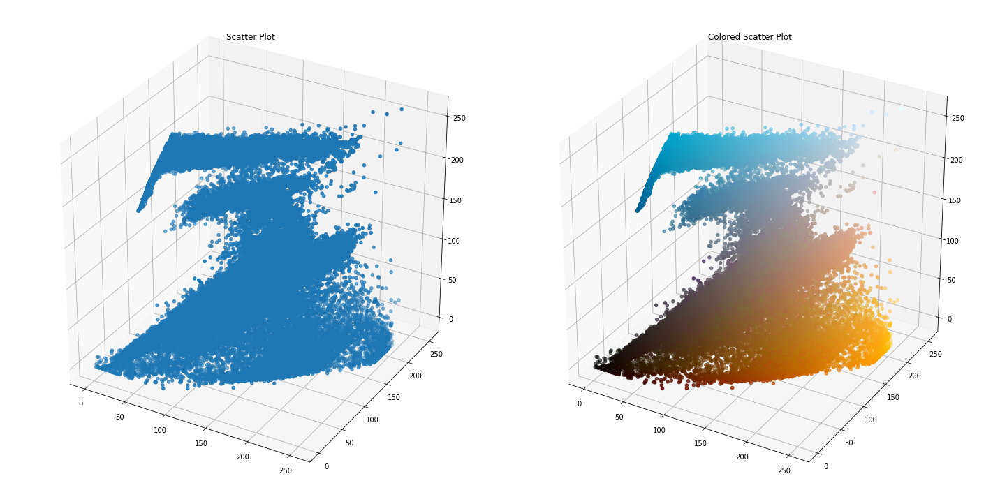

CPU times: user 41.4 s, sys: 2.12 s, total: 43.5 s
Wall time: 40.7 s


In [4]:
%%time
from mpl_toolkits.mplot3d import Axes3D

# x, y, z axis and Color
x = data[:,:,0]
y = data[:,:,1]
z = data[:,:,2]
C = list(map(tuple, data.reshape(data.shape[0]*data.shape[1], 3)/255.0))


fig = plt.figure(figsize=(20,10))

# plot 1 : simple scatter plot
ax1 = fig.add_subplot(121,projection='3d')
ax1.scatter(x,y,z)
ax1.set_title('Scatter Plot')

# plot 2 : colored scatter plot
ax2 = fig.add_subplot(122,projection='3d')
ax2.scatter(x,y,z,c=C)
ax2.set_title('Colored Scatter Plot')

plt.tight_layout()
plt.show()

I can see that there is some division in the scatter plot.

In the picture, there are about **6 main colors**. So let's use **clustering** to break it down into a total of six.

In [5]:

x = data[:,:,0] 
y = data[:,:,1]
z = data[:,:,2]
C = list(map(tuple, data.reshape(data.shape[0]*data.shape[1], 3)/255.0))

fig = go.Figure(data=[go.Scatter3d(
    x=x.reshape(1,-1)[0],
    y=y.reshape(1,-1)[0],
    z=z.reshape(1,-1)[0],
    mode='markers',
    marker=dict(
        size=3,
        color=C,
        opacity=0.7
    )
)])

fig.show()

## 4. Clustering & Visualization

For clustering, I will use **kmeans**, which is relatively straightforward and can be counted.

1. data scaling
2. clustering

In [6]:
%%time
points = data.reshape(data.shape[0]*data.shape[1], 3)/255.0

kmeans = KMeans(n_clusters=6).fit(points)
kmeans.labels_

CPU times: user 4.07 s, sys: 3.34 s, total: 7.41 s
Wall time: 2.26 s


array([2, 2, 2, ..., 4, 4, 4], dtype=int32)

Let's look at the parts of the color separately.

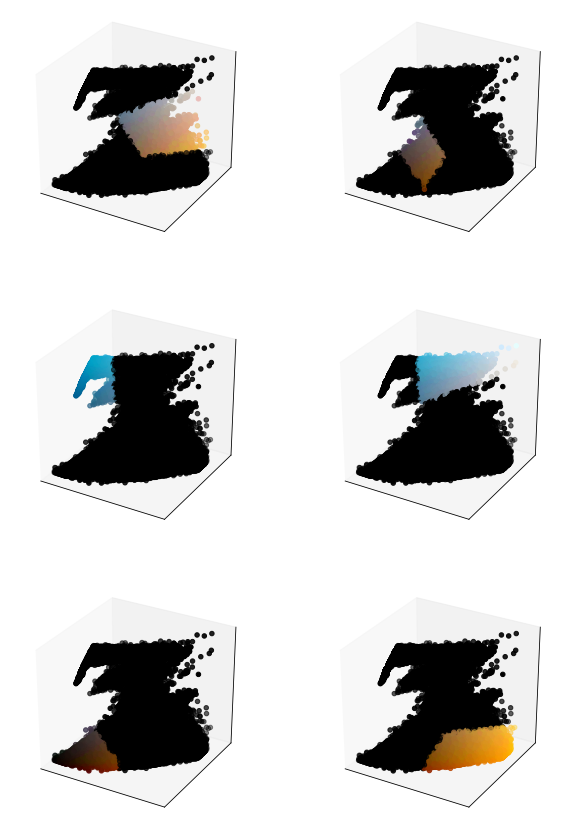

CPU times: user 1min 50s, sys: 4.58 s, total: 1min 54s
Wall time: 1min 48s


In [7]:
%%time 

fig = plt.figure(figsize=(10,15))
for i in range(6):
    ax = fig.add_subplot(3,2,i+1,projection='3d')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    C = list(map(tuple,points * (kmeans.labels_==i).reshape(-1,1)))
    ax.scatter(x,y,z,c=C)
plt.show()
    

## 5. Complete!!

Finally, you can draw with a palette like this:

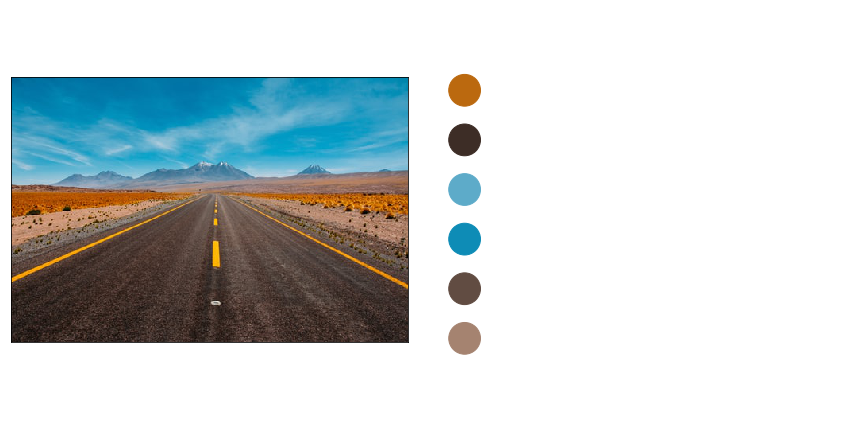

In [8]:
fig, ax = plt.subplots(1,2, figsize=(12,12))
ax[0].imshow(img)

# No ticks
ax[0].set_xticks([])
ax[0].set_yticks([])

# color palette with plt.Circle
for i in range(6):
    circle = plt.Circle((0.05, (i+1.4)/8), 0.04, color=(points * (kmeans.labels_==i).reshape(-1,1)).sum(axis=0) / sum((kmeans.labels_==i)))
    ax[1].add_artist(circle)

# make xy scale equal & axis off 
plt.gca().set_aspect('equal', adjustable='box')
plt.axis('off')

plt.tight_layout()
plt.show()

## + Convert RGB to HSV 

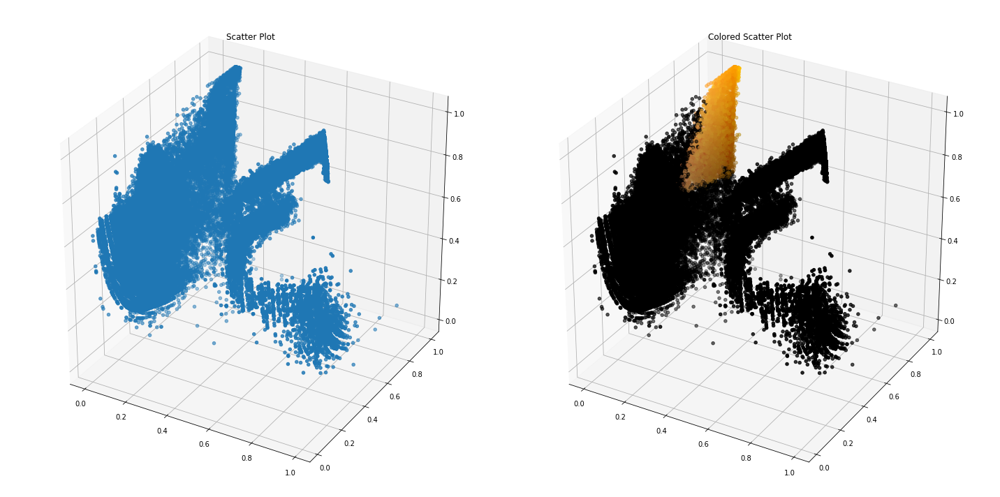

In [9]:
from skimage.color import rgb2hsv

data = rgb2hsv(img)


# x, y, z axis and Color
x = data[:,:,0]
y = data[:,:,1]
z = data[:,:,2]

fig = plt.figure(figsize=(20,10))

# plot 1 : simple scatter plot
ax1 = fig.add_subplot(121,projection='3d')
ax1.scatter(x,y,z)
ax1.set_title('Scatter Plot')

# plot 2 : colored scatter plot
ax2 = fig.add_subplot(122,projection='3d')
ax2.scatter(x,y,z,c=C)
ax2.set_title('Colored Scatter Plot')

plt.tight_layout()
plt.show()

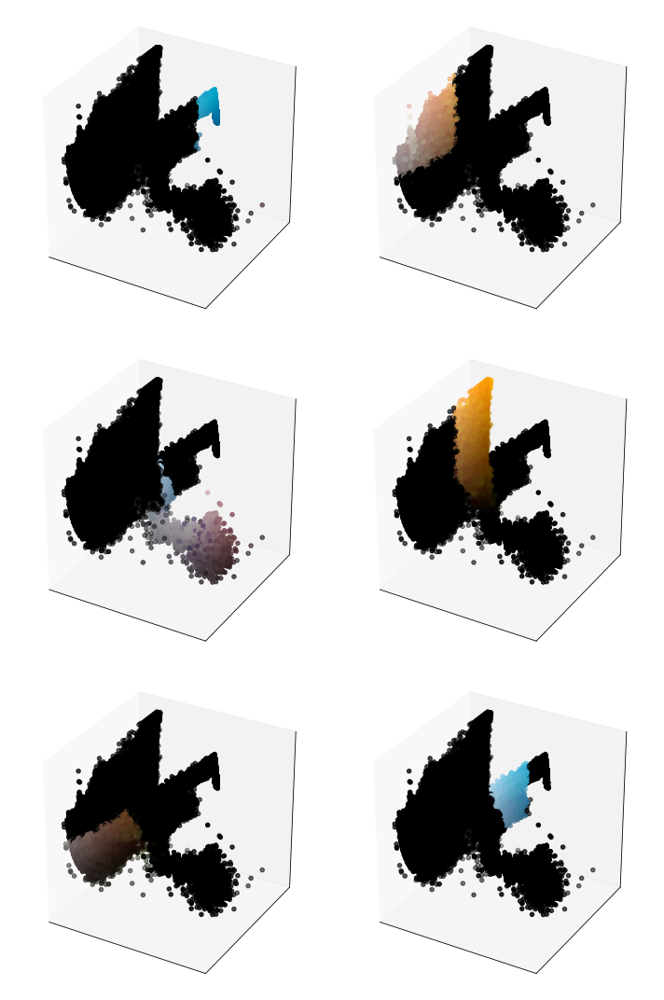

CPU times: user 2min, sys: 8.25 s, total: 2min 8s
Wall time: 1min 56s


In [10]:
%%time
points2 = data.reshape(data.shape[0]*data.shape[1], 3)

kmeans2 = KMeans(n_clusters=6).fit(points2)

fig = plt.figure(figsize=(10,15))
for i in range(6):
    ax = fig.add_subplot(3,2,i+1,projection='3d')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    C = list(map(tuple,points * (kmeans2.labels_==i).reshape(-1,1)))
    ax.scatter(x,y,z,c=C)

plt.tight_layout()    
plt.show()

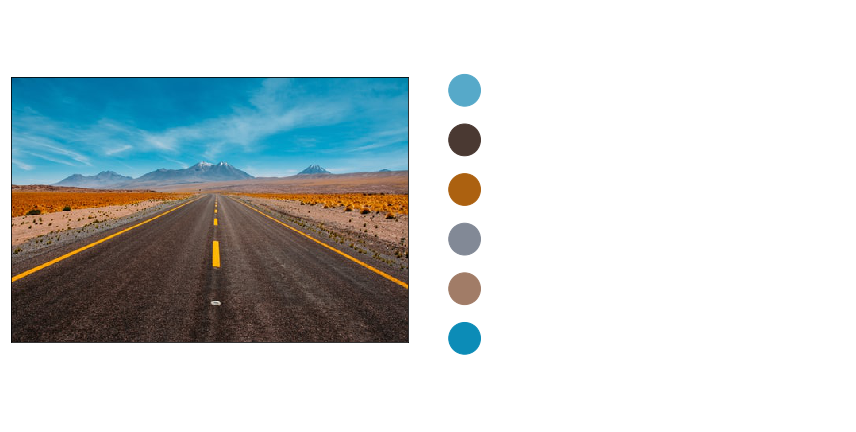

In [11]:
fig, ax = plt.subplots(1,2, figsize=(12,12))
ax[0].imshow(img)

# No ticks
ax[0].set_xticks([])
ax[0].set_yticks([])

# color palette with plt.Circle
for i in range(6):
    circle = plt.Circle((0.05, (i+1.4)/8), 0.04, color=(points * (kmeans2.labels_==i).reshape(-1,1)).sum(axis=0) / sum((kmeans2.labels_==i)))
    ax[1].add_artist(circle)

# make xy scale equal & axis off 
plt.gca().set_aspect('equal', adjustable='box')
plt.axis('off')

plt.tight_layout()
plt.show()